# Introduction
GitHub: https://github.com/beha9089/DTSA_5510_Final

### Abstract

This report compares two models at the task of classifying forest cover type in the cover types data set. We learn a RandomForestClassifier on the data as a baseline for the classification task and then compare these results with a KMeans clustering model at the same task. The supervised model performs exceptionally well with little manual effort, as a GridSearchCV object does the heavy-lifting, while several attempts at Kmeans yield little success. We conclude based on these results that this problem is poorly specified for an unsupervised model.

### Data

The forest cover types data is a multiclass classification data set produced by the UCI Machine Learning Repository and made available in SKLearn. Each record in the data represents a 30m$^2$ patch of US forest. The data contains approx. 580K samples with 54 features per sample, not including the target, which is an integer value from 0 to 6. All features are numeric, with 10 real-valued and 44 binary (0/1).

### Resources
* Data set host page and details: https://archive.ics.uci.edu/dataset/31/covertype
* Example use of KMeans with a Pipeline object: https://shorturl.at/jAMVW
* SKLearn KMeans user guide: https://scikit-learn.org/stable/modules/clustering.html#k-means

## Preliminaries

We begin with package imports and loading the data. The final import, fetch_covtype, will allow us to read in the data (as a 'Bunch' obbject). The data are imported as a dictionary-like object and so we will create an initial DataFrame to support our EDA procedure

In [1]:
# Some basics
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# Some things to help with building models
from sklearn import metrics
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from itertools import product, permutations
# Models
from sklearn.cluster import KMeans
from sklearn.decomposition import NMF, PCA
from sklearn.ensemble import RandomForestClassifier
# For the data
from sklearn.datasets import fetch_covtype

In [2]:
# Get the data (as a Bunch object)
forest = fetch_covtype()

# Extract the elements from the Bunch
data, target, target_name, feature_names, descr =  forest['data'], forest['target'], forest['target_names'], forest['feature_names'], forest['DESCR']

# Create a base DataFrame with the data
df = pd.DataFrame(np.concatenate((data, np.reshape(target, (target.shape[0], 1))), axis = 1), 
                  columns = (feature_names + target_name))

In [3]:
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Cover_Type
0,2596.0,51.0,3.0,258.0,0.0,510.0,221.0,232.0,148.0,6279.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
1,2590.0,56.0,2.0,212.0,-6.0,390.0,220.0,235.0,151.0,6225.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
2,2804.0,139.0,9.0,268.0,65.0,3180.0,234.0,238.0,135.0,6121.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
3,2785.0,155.0,18.0,242.0,118.0,3090.0,238.0,238.0,122.0,6211.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
4,2595.0,45.0,2.0,153.0,-1.0,391.0,220.0,234.0,150.0,6172.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0


# Analysis (EDA)

Now that we have read in our data, we move onto our EDA procedure. We begin with very high-level views of our data, to, for example, check for NULL/NaN values and view relatedness between features, then we perform some basic feature engineering, and finally look more in-depth at the relation between several features and our target.

### High-level Investigation

#### Summaries
Here we note several aspects of our data:
* There are no NULL or NaN values in any feature
* The majority of features are indicators
* Only one feature, Vertical_Distance_To_Hydrology, has negative values
* The class labels are quite imbalanced, with Cover_Type 1 and 2 constituting the vast majority of samples

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581012 entries, 0 to 581011
Data columns (total 55 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   Elevation                           581012 non-null  float64
 1   Aspect                              581012 non-null  float64
 2   Slope                               581012 non-null  float64
 3   Horizontal_Distance_To_Hydrology    581012 non-null  float64
 4   Vertical_Distance_To_Hydrology      581012 non-null  float64
 5   Horizontal_Distance_To_Roadways     581012 non-null  float64
 6   Hillshade_9am                       581012 non-null  float64
 7   Hillshade_Noon                      581012 non-null  float64
 8   Hillshade_3pm                       581012 non-null  float64
 9   Horizontal_Distance_To_Fire_Points  581012 non-null  float64
 10  Wilderness_Area_0                   581012 non-null  float64
 11  Wilderness_Area_1         

In [5]:
# Summarize the non-binary features
non_bin_cols = feature_names[0:10] + target_name
df[non_bin_cols].describe()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type
count,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000
mean,2959.365301,155.656807,14.103704,269.428217,46.418855,2350.146611,212.146049,223.318716,142.528263,1980.291226,2.051471
std,279.984734,111.913721,7.488242,212.549356,58.295232,1559.254870,26.769889,19.768697,38.274529,1324.195210,1.396504
min,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2809.000000,58.000000,9.000000,108.000000,7.000000,1106.000000,198.000000,213.000000,119.000000,1024.000000,1.000000
50%,2996.000000,127.000000,13.000000,218.000000,30.000000,1997.000000,218.000000,226.000000,143.000000,1710.000000,2.000000
75%,3163.000000,260.000000,18.000000,384.000000,69.000000,3328.000000,231.000000,237.000000,168.000000,2550.000000,2.000000
max,3858.000000,360.000000,66.000000,1397.000000,601.000000,7117.000000,254.000000,254.000000,254.000000,7173.000000,7.000000


<Axes: xlabel='Cover_Type'>

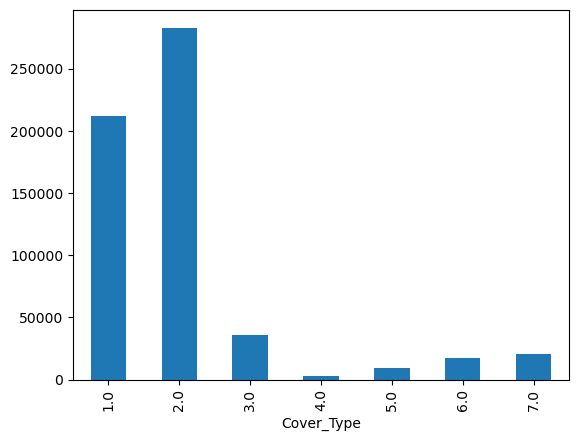

In [6]:
# Prediction may be hard her given class imbalance
df.groupby(['Cover_Type'])['Cover_Type'].count().plot.bar()

#### Correlation Visualizations

In the pair-wise correlations matrix, we note that no feature is strong correlated with Cover_Type and the strongest correlation exists between Hillshade_Noon and Hillshade_3pm, which is reasonable. 

There are several interesting patterns/shapes in the pairs plot, notably in the interactions with the Hillshade features. Likely these are the result of physical phenomena and not oddities in the data. We also notice clustering of zero-values in the Hillshade features, and so take a closer look. On further inspection, the data appear fine.

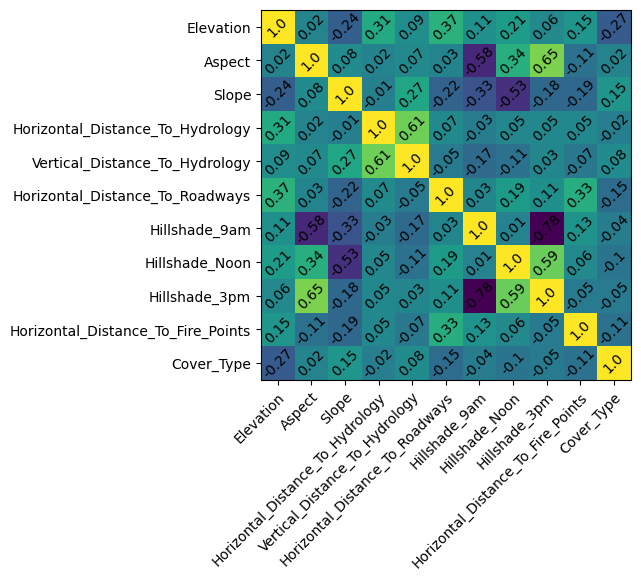

In [7]:
# Compute the pair-wise correlations
corr = df.loc[:, non_bin_cols].corr()

# Create the figure and axis objects
fig, ax = plt.subplots()
cax = ax.imshow(corr)

# Set the axis labels
ticks = np.arange(0, corr.shape[0], 1)
ax.set_xticks(ticks, corr.index)
ax.set_yticks(ticks, corr.index)
# Edit the x-axis labels
plt.setp(ax.get_xticklabels(), rotation = 45, ha = 'right',
         rotation_mode = 'anchor')
# Add correlation values to figure
[ax.text(i, j, round(corr.iloc[i, j], 2), ha = 'center', va = 'center', rotation = 45) for i in ticks for j in ticks]

plt.show()

In the pair plot below, Elevation looks like it should be helpful in differentiating Cover_Type. The distance measures look promising too, as well Hillshade_9am and Hillshade_Noon.

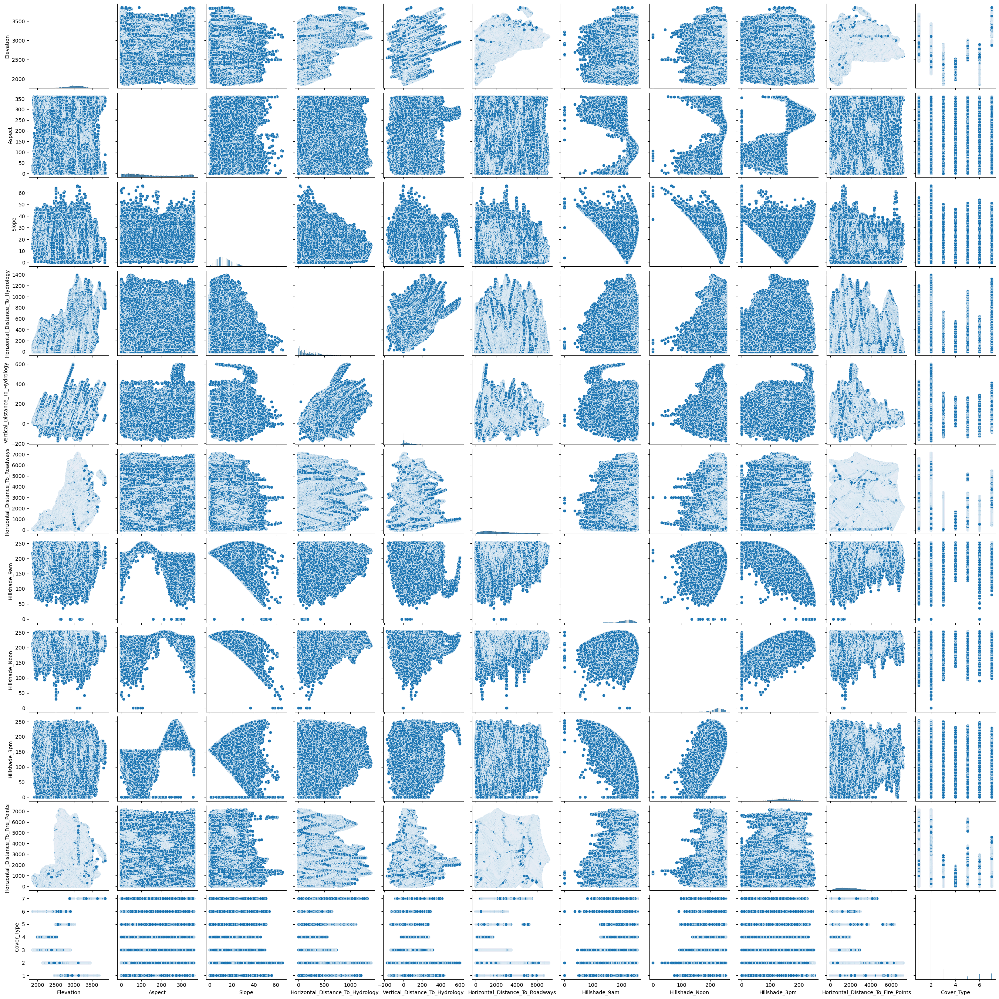

In [8]:
sns.pairplot(df.loc[:, non_bin_cols])

In taking a closer look at the samples with non Hillshade, it does not look like these are bad data. Additionally, mostly these are comprised of samples with no hillshade at 3pm.

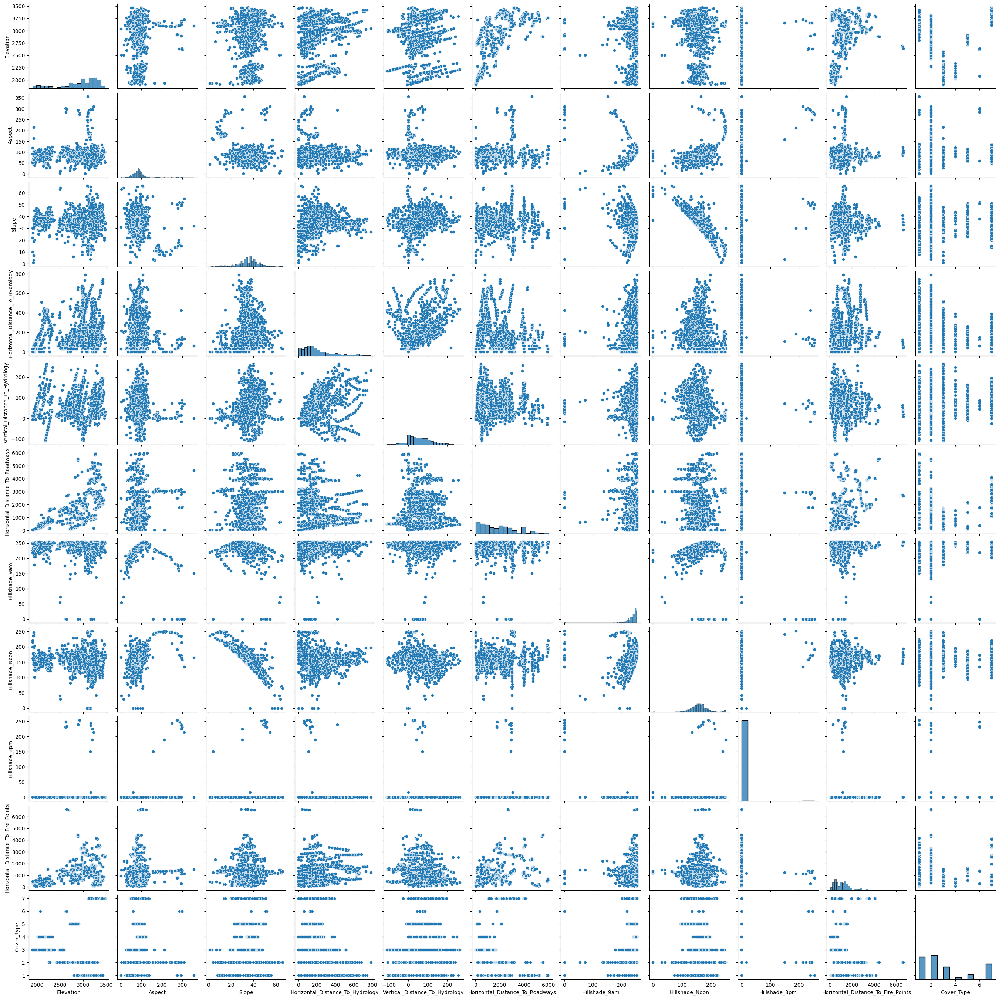

In [9]:
# Define the records with no hillshade
no_shade_idx = df[(df['Hillshade_9am'] == 0) | (df['Hillshade_Noon'] == 0) | (df['Hillshade_3pm'] == 0)].index

sns.pairplot(df.loc[no_shade_idx, non_bin_cols])

### Feature Engineering
The Soil_Type and Wilderness_Area columns are binary features that make up the majority of the features in our data. Below we show that these sets can actually be represented by one categorical feature each. We demonstrate this and then add these features to our DataFrame.

In [10]:
# Get the column names for easier access
wilderness_cols = feature_names[10:14]
soil_cols = feature_names[14:len(feature_names)]

# Sum across the columns within each record and sum the result
wild_sum = sum(np.sum(df.loc[:, wilderness_cols], axis = 1))
soil_sum = sum(np.sum(df.loc[:, soil_cols], axis = 1))

if (wild_sum == df.shape[0]) & (soil_sum == df.shape[0]):
    print('Wilderness_Area and Soil_Type features are mutually exclusive')
    # Create the categorical features, with values based on the original indicator features
    # Wilderness_Area ranges 0 - 3, and Soil_Type ranges 0 - 39
    df['Wilderness_Area'] = df.loc[:, wilderness_cols].idxmax(axis = 1).str.lstrip('Wilderness_Area_').astype('int').astype('category')
    df['Soil_Type'] = df.loc[:, soil_cols].idxmax(axis = 1).str.lstrip('Soil_Type_').astype('int').astype('category')

Wilderness_Area and Soil_Type features are mutually exclusive


In [11]:
# Define the non-binary columns
non_bin_cols = df.columns[0:10].union(df.columns[(len(df.columns)-3):len(df.columns)], sort = False)
model_cols = non_bin_cols[non_bin_cols != 'Cover_Type']

### (Select Visualizations) Relationships to Cover_Type

Here we take a closer look at several features by Cover_Type value, and note a significant volume of outliers across Cover_Type values in each feature. Additionally:
* Elevation has best separation; lots of outliers in all but Cover_Type 3 and 4
* The Hydrology features are the weakest of the selected features, and show significant outliers
* Horizontal_Distance_To_Roadways shows good separation, outliers not too bad
* Horizontal_Distance_To_Fire_Points similar to Roadways but with more outliers
* Soil_Type shows good separation but ranges are wide, produces groups


<Axes: title={'center': 'Elevation'}, xlabel='[Cover_Type]'>

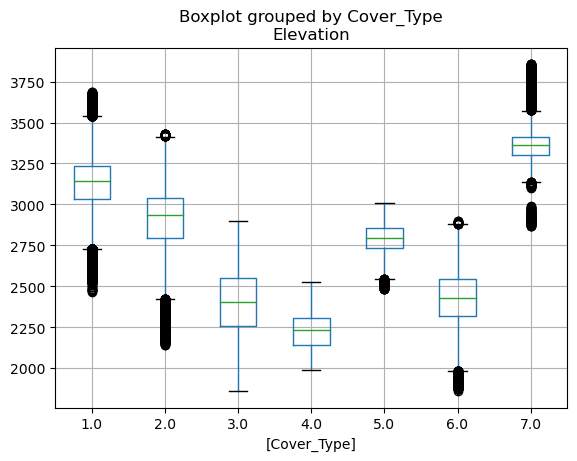

In [12]:
df.boxplot(column = ['Elevation'], by = ['Cover_Type'])

<Axes: title={'center': 'Horizontal_Distance_To_Hydrology'}, xlabel='[Cover_Type]'>

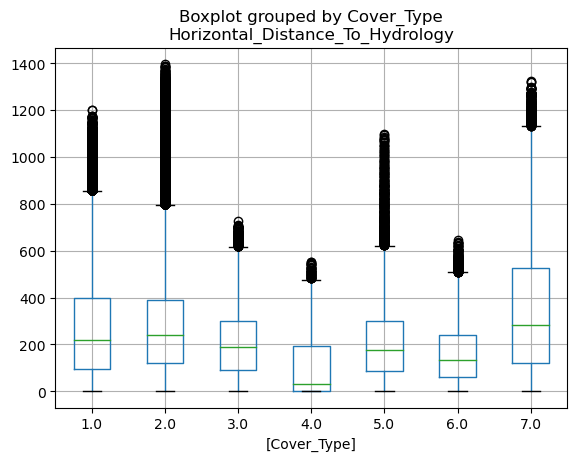

In [13]:
df.boxplot(column = ['Horizontal_Distance_To_Hydrology'], by = ['Cover_Type'])

<Axes: title={'center': 'Vertical_Distance_To_Hydrology'}, xlabel='[Cover_Type]'>

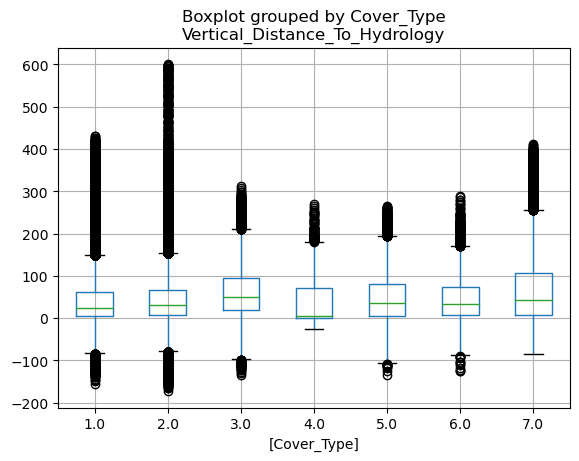

In [14]:
df.boxplot(column = ['Vertical_Distance_To_Hydrology'], by = ['Cover_Type'])

<Axes: title={'center': 'Horizontal_Distance_To_Roadways'}, xlabel='[Cover_Type]'>

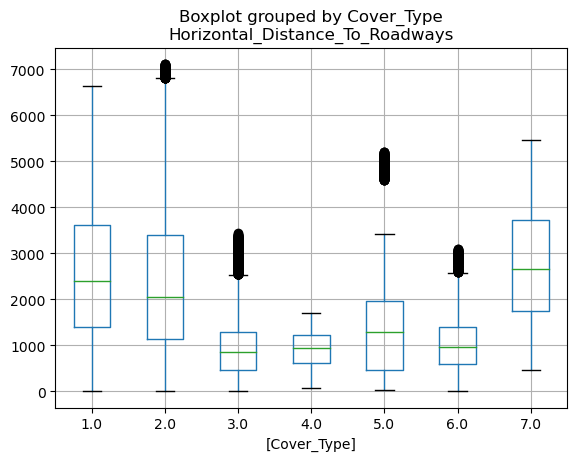

In [15]:
df.boxplot(column = ['Horizontal_Distance_To_Roadways'], by = ['Cover_Type'])

<Axes: title={'center': 'Horizontal_Distance_To_Fire_Points'}, xlabel='[Cover_Type]'>

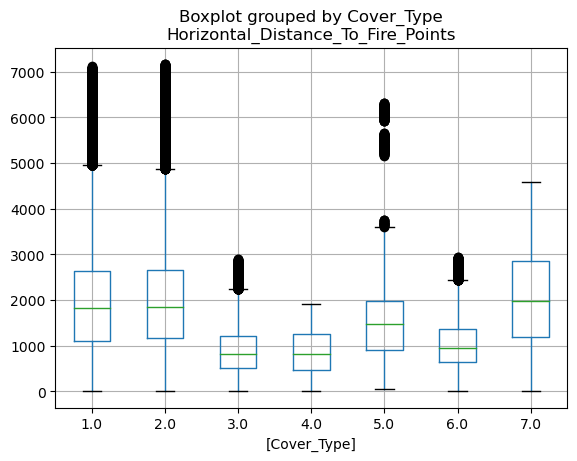

In [16]:
df.boxplot(column = ['Horizontal_Distance_To_Fire_Points'], by = ['Cover_Type'])

<Axes: title={'center': 'Soil_Type'}, xlabel='[Cover_Type]'>

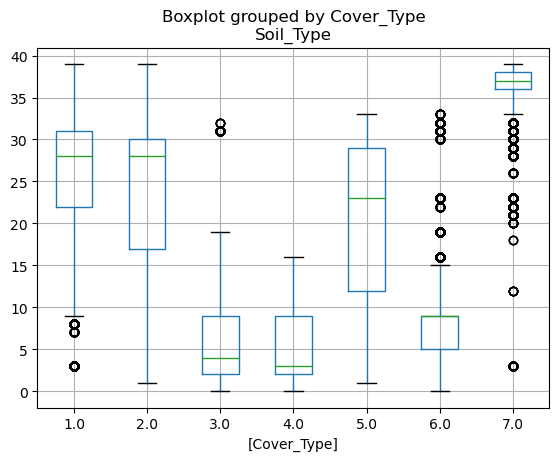

In [17]:
df.boxplot(column = ['Soil_Type'], by = ['Cover_Type'])

# Results and Comparison

Now that we have read in our data and completed our EDA procedure, we will move on to the remainder of our work, training and evaluating models. We begin our modeling work by handling some preliminary items, such as defining helper functions and splitting the data, before moving on to the models. Our first model is a RandomForestClassifier and we conclude with several KMeans clustering algorithms.

## Preliminaries
Before jumping into our models we define three helper functions, split our data into test and train sets, and create DataFrames to store the classification predictions from our models. The three helper functions are
1. model_results: Visualize classification report and confusion matrix
2. kmeans_scorer: Fit a KMeans model to data and report scores
3. labels_permute: Find the mapping between ground truth labels and cluster labels

In [18]:
def model_results(y_true, y_pred, model):
    '''
    Produce classification report and confusion matrix to summarize model results
    
    y_true: groupd truth labels
    y_pred: prediction labels
    model: the name of the model that produced y_pred
    '''
    # Print the classification report
    print(metrics.classification_report(y_true, y_pred, digits = 3))
    # Define the confusion matrix
    cm = metrics.confusion_matrix(y_true, y_pred)
    # Display the confusion matrix
    dsp = metrics.ConfusionMatrixDisplay(cm)
    dsp.plot()
    plt.title(model + ' Confusion Matrix')
    plt.show()

In [19]:
def kmeans_scorer(model, df, y_true, name):
    '''
    Helper function for scoring KMeans models
    
    model: a defined KMeans model
    df: DataFrame of training data
    y_true: ground truth labels
    name: a name to identify the model
    '''
    estimator = make_pipeline(StandardScaler(), model).fit(df)
    y_pred = pd.Series(estimator[-1].labels_)

    # Compute model metrics
    homo_score = metrics.homogeneity_score(y_true, y_pred)
    comp_score = metrics.completeness_score(y_true, y_pred)
    
    print(name, '\t Homogeneity: {}, Completeness: {}'.format(round(homo_score, 3), round(comp_score, 3)))

In [20]:
def labels_permute(y_true, y_pred, frac = 0.5):
    '''
    Helper function to map cluster labels to target labels
    
    y_true: ground truth labels
    y_pred: prediction labels 
    frac: sample ratio
    '''
    labels = sorted(list(y_true.unique()))
    n = len(labels)
    # Randomly sample points
    t_sample = y_true.sample(frac = frac, ignore_index = True)
    p_sample = y_pred[t_sample.index]
    # Initialize the benchmarks
    best_map = dict(zip(list(y_pred.unique()), labels))
    best_match = sum(t_sample.values == p_sample.values)
    # Loop through all label permutation to find the best match
    for prm in permutations(range(n)):
        # Create a map between the predicted and actual labels
        label_map = dict(zip(prm, labels))
        # Map the predicted labels
        y_alt = p_sample.apply(lambda i: label_map[i])
        # Count the number of matches
        match_cnt = sum(y_alt.values == t_sample.values)

        # Check if this mapping is best
        if match_cnt > best_match: 
            best_map = label_map
            best_match = match_cnt            
    
    return best_map

In [25]:
X_train, X_test, y_train, y_test = train_test_split(df[model_cols], df['Cover_Type'], test_size = 0.35, random_state = 123)

print('Shape: X_train = {}, X_test = {}, y_train = {}, y_test = {}'.format(X_train.shape, X_test.shape, y_train.shape, y_test.shape))

Shape: X_train = (377657, 12), X_test = (203355, 12), y_train = (377657,), y_test = (203355,)


In [22]:
# Create DataFrames to store the model predictions
X_train_preds = pd.DataFrame()
X_test_preds = pd.DataFrame()

## Models

We begin with learning a variety of RandomForestClassifer models on the data via a test-and-see apprach in order to test many configurations. Based on these results we perform a further search using a GridSearchCV object. This is resource, and time, intensive given the number of fits of the ensemble model. However, we see extremely high performance from the result. We then try a variety of approaches with KMeans clusting models with varying success, though in no outcome do we see performance in the same ballpark as our random forest model. The advantage of KMeans here is the speed and efficiency of the algorithm, which allowed us to quickly iterate through candidates.

### RandomForest

#### Training
We begin our training with a broad search of the hyperparameters to identify likely candidates for an optimal model, before performing an exhaustive search with cross-validation using a GridSearchCV object. 

We use GridSearchCV to find the best combination of criterion and number of estimators. As we can see in the results below, this does yield an overfitted model, albeit with very high performance in the test data. We did experiment with various combinations of other hyperparameters to control for overfitting but found diminished results in every parameterization that restricted the growth of trees. 

In [26]:
n_estimators = [100, 125, 150]
criterion = ['gini', 'entropy', 'log_loss']
max_depth = [30, 40, 50]
min_samples_split = [2, 3]
min_samples_leaf = [1, 2]

labels = ['1.0', '2.0', '3.0', '4.0', '5.0', '6.0', '7.0']
forest_results = []

for params in product(n_estimators, criterion, max_depth, min_samples_split, min_samples_leaf):
    forest = RandomForestClassifier(random_state = 0, n_jobs = -1, n_estimators = params[0], criterion = params[1],
                                    max_depth = params[2], min_samples_split = params[3], min_samples_leaf = params[4])
    # Train the model
    forest.fit(X_train, y_train)
    # Predict on test
    preds = forest.predict(X_test)
    # Get the classification report
    report = pd.DataFrame.from_dict(metrics.classification_report(y_test, preds, output_dict = True))
    report = report.loc[['precision', 'recall', 'f1-score'], labels]
    # Get the worst scores in each metric
    min_scores = list(np.min(report, axis = 1))
    # Store the results
    forest_results.append(list(params) + min_scores)
    
    if len(forest_results) % 10 == 0:
        print('Models completed: {}'.format(len(forest_results)))

# Store the results
cols = ['n_estimators', 'criterion', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'precision', 'recall', 'f1-score']
forest_results = pd.DataFrame(forest_results, columns = cols)

# Get the top ten models, based on sum of worst-case metrics
top_mods_idx = np.sum(forest_results.loc[:, ['precision', 'recall', 'f1-score']], axis = 1).sort_values(ascending = False).index[0:10]

# View the best models
forest_results.loc[top_mods_idx,]

Models completed: 10
Models completed: 20
Models completed: 30
Models completed: 40
Models completed: 50
Models completed: 60
Models completed: 70
Models completed: 80
Models completed: 90
Models completed: 100


,n_estimators,criterion,max_depth,min_samples_split,min_samples_leaf,precision,recall,f1-score
48,125,entropy,30,2,1,0.908709,0.812519,0.870301
60,125,log_loss,30,2,1,0.908709,0.812519,0.870301
100,150,log_loss,40,2,1,0.908228,0.810696,0.870047
88,150,entropy,40,2,1,0.908228,0.810696,0.870047
104,150,log_loss,50,2,1,0.908898,0.810088,0.869253
92,150,entropy,50,2,1,0.908898,0.810088,0.869253
96,150,log_loss,30,2,1,0.911392,0.807657,0.867918
84,150,entropy,30,2,1,0.911392,0.807657,0.867918
24,100,log_loss,30,2,1,0.907660,0.809784,0.869494
12,100,entropy,30,2,1,0.907660,0.809784,0.869494


From the 10 best models we can see:
* We only need to search within one criterion, as entropy and log_loss are equivalent
* We should searches on n_estimators 100, 125, and 150
* We can leave min_samples_split and min_samples_leaf at default values

In [27]:
param_grid = [
    {'n_estimators': [100, 125, 150],
     'criterion': ['log_loss'],
     'max_depth': [30, 40, 50]
    }
]

In [28]:
tree = GridSearchCV(RandomForestClassifier(random_state = 0, n_jobs = -1, verbose = 1), param_grid, n_jobs = -1)
tree.fit(X_train, y_train)

print('Best parameters: {}'.format(tree.best_params_))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.2s


Best parameters: {'criterion': 'log_loss', 'max_depth': 50, 'n_estimators': 150}


[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:   27.1s finished


#### Evaluation
As can be seen below, our model *perfectly* classifies our training sample, which indicates overfitting. However, the generalization onto the test data is quite excellent. The overall accuracy in classifying the test data is 96.2% and the lowest F1 scores are 86.9% and 87.8% on Cover_Type 5 and 4, respectively, which have the fewest samples in the data.

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.6s
[Parallel(n_jobs=12)]: Done 150 out of 150 | elapsed:    2.9s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.3s
[Parallel(n_jobs=12)]: Done 150 out of 150 | elapsed:    1.6s finished


              precision    recall  f1-score   support

         1.0      1.000     1.000     1.000    137773
         2.0      1.000     1.000     1.000    184181
         3.0      1.000     1.000     1.000     23332
         4.0      1.000     1.000     1.000      1737
         5.0      1.000     1.000     1.000      6202
         6.0      1.000     1.000     1.000     11229
         7.0      1.000     1.000     1.000     13203

    accuracy                          1.000    377657
   macro avg      1.000     1.000     1.000    377657
weighted avg      1.000     1.000     1.000    377657



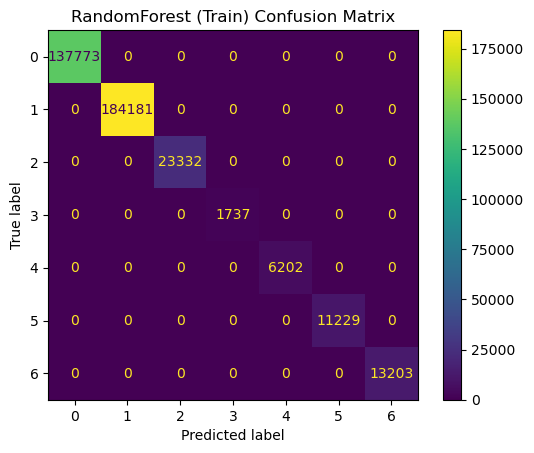

              precision    recall  f1-score   support

         1.0      0.969     0.955     0.962     74067
         2.0      0.960     0.976     0.968     99120
         3.0      0.946     0.967     0.957     12422
         4.0      0.909     0.850     0.878      1010
         5.0      0.938     0.810     0.869      3291
         6.0      0.942     0.913     0.927      6138
         7.0      0.976     0.954     0.965      7307

    accuracy                          0.962    203355
   macro avg      0.948     0.918     0.932    203355
weighted avg      0.962     0.962     0.962    203355



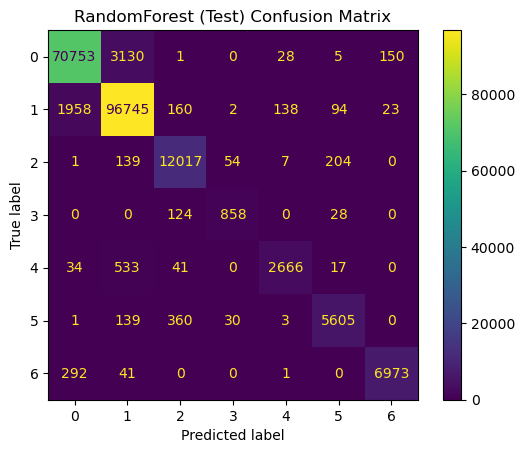

In [29]:
# Store the predictions from the best estimator
X_train_preds['RandomForest'] = tree.best_estimator_.predict(X_train)
X_test_preds['RandomForest'] = tree.best_estimator_.predict(X_test)

# Visualize the results
model_results(y_train, X_train_preds.RandomForest, 'RandomForest (Train)')
model_results(y_test, X_test_preds.RandomForest, 'RandomForest (Test)')

#### Feature Importance
A benefit of choosing to fit a RandomForestClassifier is that it allows us to get an estimate for the relative importance of each feature in the classification task. Below we can see that Elevation is the most important feature, followed by Soil_Type, Horizontal_Distance_To_Roadways, and Horizontal_Distance_To_Fire_Points. These results jibe with our prior analysis on feature relation to Cover_Type, as discussed based on their boxplots.

<Axes: >

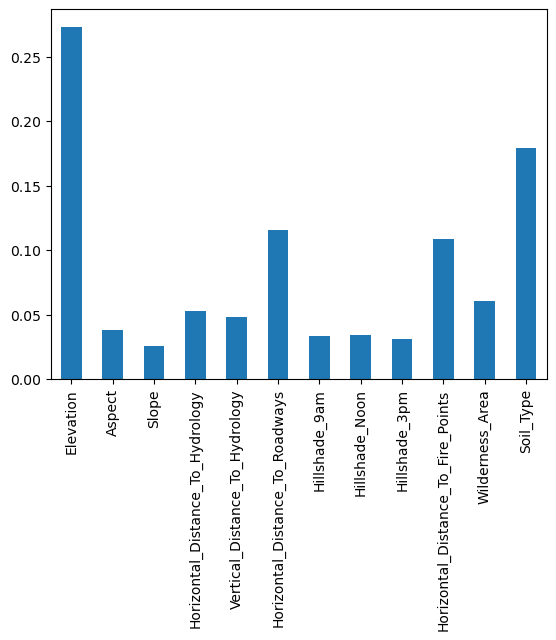

In [30]:
# Get feature importance scores from the RandomForest
importances = tree.best_estimator_.feature_importances_
feat_import = pd.Series(importances, index = X_train.columns)
# Visualize
feat_import.plot.bar()

### Kmeans

#### Training
A key benefit of KMeans clustering is its ability to scale efficiently with input size. This means that we can more easily try various strategies to find the best model for our task. We search in two phases: The first to identify, broadly, the best strategy based on homogeneity and completeness metrics, and the second further drilling down on these initial results. We then fit two models based on our findings and compare their performance.

As stated previously, in no scenario do we achieve classification results comparable to the supervised model.

Here we perform a high-level search to establish a direction for further investigation. We pursue three approaches
1. Try both initializations and algorithms, fitting KMeans with the StandardScalar using all features
2. Try both initializations and algorithms, fitting KMeans with the StandardScalar using just the top 5 features
3. Try both algorithms, fitting KMeans with the StandardScalar using an initialization based on PCA

We see the best results with random initialization and the top several features, but no difference in algorithms. 

In [31]:
# Define the various hyper parameters
init = ['k-means++', 'random']
algo = ['lloyd', 'elkan']
n_clusters = 7
n_feats = 5
top_feats = feat_import.sort_values(ascending = False)[0:n_feats].index

# Try KMeans on all features
for params in product(init, algo):
    kmeans = KMeans(n_clusters = n_clusters, random_state = 0, n_init = 'auto', init = params[0], algorithm = params[1])
    kmeans_scorer(kmeans, X_train, y_train, params)

# Try KMeans on just the top n_feats features
for params in product(init, algo):
    name = 'Top ' + str(n_feats) + ' features ' + str(params)
    kmeans = KMeans(n_clusters = n_clusters, random_state = 0, n_init = 'auto', init = params[0], algorithm = params[1])
    kmeans_scorer(kmeans, X_train[top_feats], y_train, name)
    
# Try KMeans with PCA
pca = PCA(n_components = 7).fit(X_train)
for alg in algo:
    name = 'PCA-based ' + alg
    kmeans = KMeans(n_clusters = n_clusters, random_state = 0, n_init = 1, init = pca.components_, algorithm = alg)
    kmeans_scorer(kmeans, X_train, y_train, name)

('k-means++', 'lloyd') 	 Homogeneity: 0.182, Completeness: 0.118
('k-means++', 'elkan') 	 Homogeneity: 0.182, Completeness: 0.118
('random', 'lloyd') 	 Homogeneity: 0.182, Completeness: 0.118
('random', 'elkan') 	 Homogeneity: 0.182, Completeness: 0.118
Top 5 features ('k-means++', 'lloyd') 	 Homogeneity: 0.262, Completeness: 0.164
Top 5 features ('k-means++', 'elkan') 	 Homogeneity: 0.262, Completeness: 0.164
Top 5 features ('random', 'lloyd') 	 Homogeneity: 0.272, Completeness: 0.172
Top 5 features ('random', 'elkan') 	 Homogeneity: 0.272, Completeness: 0.172
PCA-based lloyd 	 Homogeneity: 0.182, Completeness: 0.118
PCA-based elkan 	 Homogeneity: 0.182, Completeness: 0.118


Having just found best results with the top features approach, we take a deeper look at the possible number of features to use. Here we see the best results with the random initialization and just the top 2 features.

In [32]:
# Try both initializations with top n features
for nit in init:    
    for n_feats in range(2, len(feat_import) + 1):
        top_feats = feat_import.sort_values(ascending = False)[0:n_feats].index
        name = 'Top ' + str(n_feats) + ' features ' + str(nit)
        kmeans = KMeans(n_clusters = n_clusters, random_state = 0, n_init = 'auto', init = nit)
        kmeans_scorer(kmeans, X_train[top_feats], y_train, name)

Top 2 features k-means++ 	 Homogeneity: 0.353, Completeness: 0.232
Top 3 features k-means++ 	 Homogeneity: 0.324, Completeness: 0.203
Top 4 features k-means++ 	 Homogeneity: 0.276, Completeness: 0.175
Top 5 features k-means++ 	 Homogeneity: 0.262, Completeness: 0.164
Top 6 features k-means++ 	 Homogeneity: 0.236, Completeness: 0.15
Top 7 features k-means++ 	 Homogeneity: 0.199, Completeness: 0.13
Top 8 features k-means++ 	 Homogeneity: 0.198, Completeness: 0.124
Top 9 features k-means++ 	 Homogeneity: 0.206, Completeness: 0.129
Top 10 features k-means++ 	 Homogeneity: 0.193, Completeness: 0.124
Top 11 features k-means++ 	 Homogeneity: 0.205, Completeness: 0.13
Top 12 features k-means++ 	 Homogeneity: 0.182, Completeness: 0.118
Top 2 features random 	 Homogeneity: 0.368, Completeness: 0.235
Top 3 features random 	 Homogeneity: 0.324, Completeness: 0.203
Top 4 features random 	 Homogeneity: 0.276, Completeness: 0.175
Top 5 features random 	 Homogeneity: 0.272, Completeness: 0.172
Top 6 f

#### Evaluation (with Additional Training)
Here we learn two KMeans models on the full classification task and compare results. Both models use the random initialization and a StandardScalar and differ only in the number of features used. The full model, which uses all features in X_train, is outperformed overall by the partial model, which uses just the two 2 features, Elevation and Soil_Type. However, the partial model underperforms when we look at the individual labels, failing to correctly identify any Cover_Type 2, 3, or 6 and barely any Cover_Type 4. Again, both models significantly underperform the random forest.

              precision    recall  f1-score   support

         1.0      0.488     0.288     0.362    137773
         2.0      0.519     0.281     0.365    184181
         3.0      0.000     0.000     0.000     23332
         4.0      0.009     0.137     0.016      1737
         5.0      0.033     0.208     0.058      6202
         6.0      0.000     0.001     0.000     11229
         7.0      0.057     0.193     0.089     13203

    accuracy                          0.253    377657
   macro avg      0.158     0.158     0.127    377657
weighted avg      0.434     0.253     0.314    377657



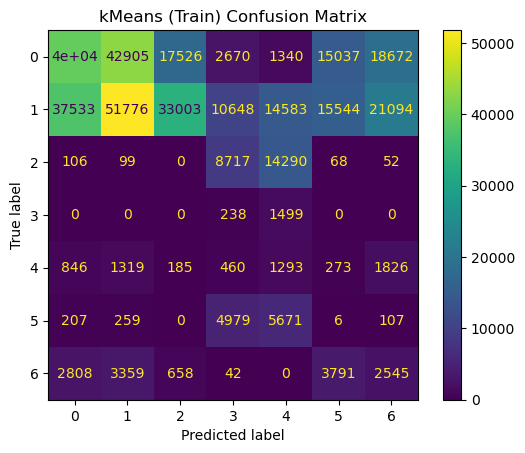

              precision    recall  f1-score   support

         1.0      0.488     0.287     0.361     74067
         2.0      0.521     0.279     0.364     99120
         3.0      0.000     0.000     0.000     12422
         4.0      0.010     0.145     0.018      1010
         5.0      0.033     0.210     0.057      3291
         6.0      0.000     0.001     0.000      6138
         7.0      0.057     0.188     0.088      7307

    accuracy                          0.251    203355
   macro avg      0.158     0.159     0.127    203355
weighted avg      0.434     0.251     0.313    203355



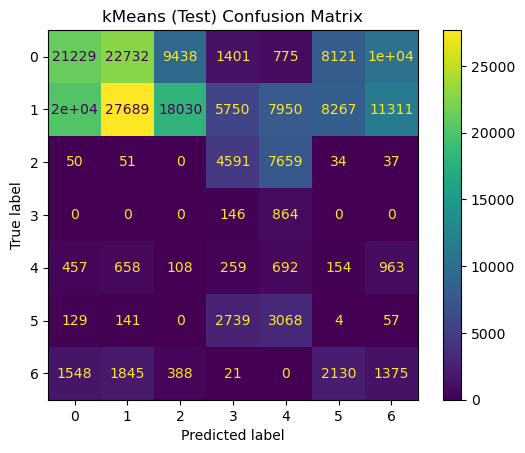

In [33]:
kmeans = KMeans(n_clusters = 7, random_state = 0, init = 'random', n_init = 'auto')
estimator = make_pipeline(StandardScaler(), kmeans).fit(X_train)

# Save the predictions
X_train_preds['kMeans'] = pd.Series(estimator[-1].labels_)
X_test_preds['kMeans'] = pd.Series(estimator.predict(X_test))
# Map the labels
label_map = labels_permute(y_train, X_train_preds['kMeans'])
# Update the predictions
X_train_preds['kMeans'] = X_train_preds['kMeans'].apply(lambda i: label_map[i])
X_test_preds['kMeans'] = X_test_preds['kMeans'].apply(lambda i: label_map[i])
# Get the results
model_results(y_train, X_train_preds['kMeans'], 'kMeans (Train)')
model_results(y_test, X_test_preds['kMeans'], 'kMeans (Test)')

              precision    recall  f1-score   support

         1.0      0.690     0.354     0.468    137773
         2.0      0.718     0.330     0.452    184181
         3.0      0.000     0.000     0.000     23332
         4.0      0.000     0.000     0.000      1737
         5.0      0.005     0.030     0.009      6202
         6.0      0.034     0.161     0.056     11229
         7.0      0.000     0.000     0.000     13203

    accuracy                          0.295    377657
   macro avg      0.207     0.125     0.141    377657
weighted avg      0.603     0.295     0.393    377657



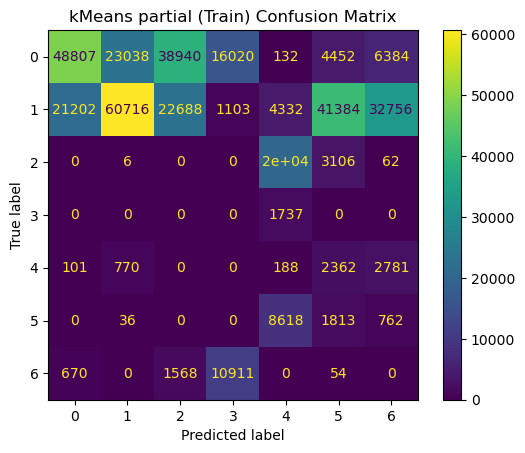

              precision    recall  f1-score   support

         1.0      0.687     0.353     0.466     74067
         2.0      0.715     0.329     0.451     99120
         3.0      0.000     0.000     0.000     12422
         4.0      0.000     0.000     0.000      1010
         5.0      0.005     0.032     0.009      3291
         6.0      0.034     0.162     0.057      6138
         7.0      0.000     0.000     0.000      7307

    accuracy                          0.294    203355
   macro avg      0.206     0.125     0.140    203355
weighted avg      0.600     0.294     0.391    203355



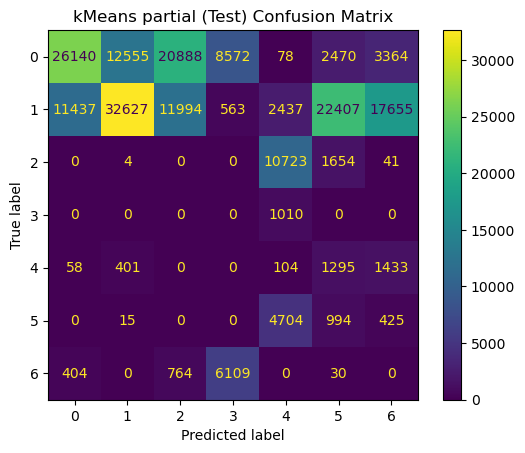

In [36]:
top_feats = feat_import.sort_values(ascending = False)[0:2].index
kmeans2 = KMeans(n_clusters = 7, random_state = 0, init = 'random', n_init = 'auto')
estimator2 = make_pipeline(StandardScaler(), kmeans).fit(X_train[top_feats])

# Save the predictions
X_train_preds['kMeans_partial'] = pd.Series(estimator2[-1].labels_)
X_test_preds['kMeans_partial'] = pd.Series(estimator2.predict(X_test[top_feats]))
# Map the labels
label_map2 = labels_permute(y_train, X_train_preds['kMeans_partial'])
# Update the predictions
X_train_preds['kMeans_partial'] = X_train_preds['kMeans_partial'].apply(lambda i: label_map2[i])
X_test_preds['kMeans_partial'] = X_test_preds['kMeans_partial'].apply(lambda i: label_map2[i])
# Get the results
model_results(y_train, X_train_preds['kMeans_partial'], 'kMeans partial (Train)')
model_results(y_test, X_test_preds['kMeans_partial'], 'kMeans partial (Test)')

## Compare
Below we see the model results, in terms of precision, recall, and F1, across the Cover_Type values. The charts illustrate the performance difference between the supervised and unsupervised algorithms.

In general, the random forest performs extremely well across all values but scores lowest on Cover_Type 4 and 5. The KMeans models perform best in Cover_Type 1 and 2 across all metrics, likely due to the proportion of samples these two represent, and quite poorly in the other Cover_Types. There is not a clear winner between full and partial model, as they oscillate with Cover_Type in each of the three metrics. 

<Axes: title={'center': 'F1-Score by Cover_Type'}>

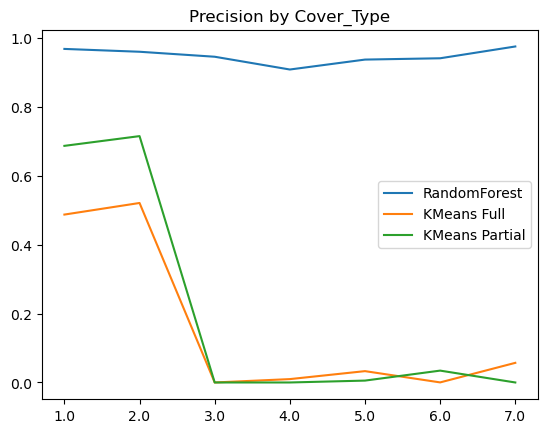

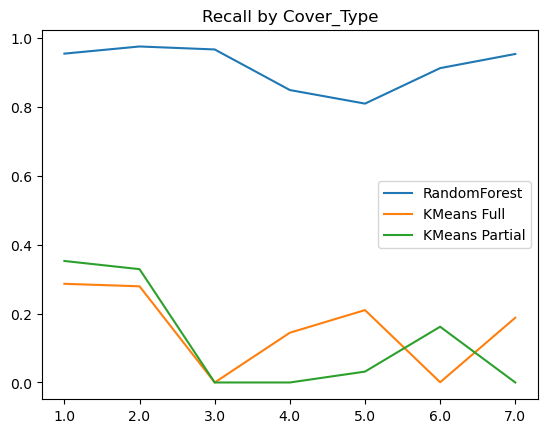

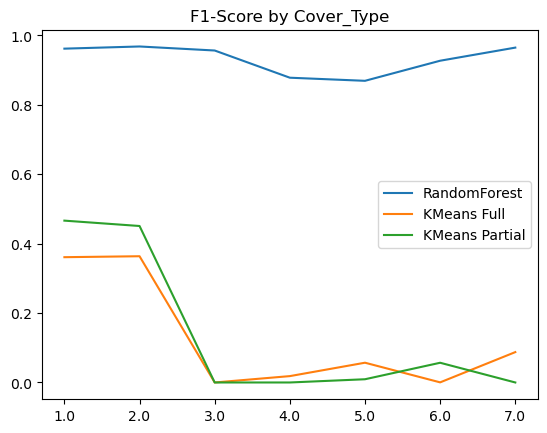

In [64]:
# Get the classification_report for each model
rm = pd.DataFrame.from_dict(metrics.classification_report(y_test, X_test_preds['RandomForest'], output_dict = True))
rm = rm.loc[['precision', 'recall', 'f1-score'], labels]
km1 = pd.DataFrame.from_dict(metrics.classification_report(y_test, X_test_preds['kMeans'], output_dict = True))
km1 = km1.loc[['precision', 'recall', 'f1-score'], labels]
km2 = pd.DataFrame.from_dict(metrics.classification_report(y_test, X_test_preds['kMeans_partial'], output_dict = True))
km2 = km2.loc[['precision', 'recall', 'f1-score'], labels]

# Combine the precision, recall, and F1 metrics into DFs
models = ['RandomForest', 'KMeans Full', 'KMeans Partial']
precis_df = pd.concat([rm.iloc[0], km1.iloc[0], km2.iloc[0]], axis = 1)
precis_df.columns = models
recall_df = pd.concat([rm.iloc[1], km1.iloc[1], km2.iloc[1]], axis = 1)
recall_df.columns = models
f1scre_df = pd.concat([rm.iloc[2], km1.iloc[2], km2.iloc[2]], axis = 1)
f1scre_df.columns = models

# Plot the metrics by model and Cover_Type
precis_df.plot.line(title = 'Precision by Cover_Type')
recall_df.plot.line(title = 'Recall by Cover_Type')
f1scre_df.plot.line(title = 'F1-Score by Cover_Type')

# Conclusion

Based on these results we can easily conclude that the RandomForestClassifier is the better model than KMeans for this problem. Obviously we cannot, and do not, conclude that KMeans is a worse algorithm in general. Instead, we believe that the problem chosen, multi-class classification, is squarely in the wheelhouse of supervised learning and an unsupervised method is unsuitable. 

Potentially, with additional features or better class balancing, we could see better, more comparable, performance from KMeans. But in this problem, with this dataset, the KMeans algorithm is not able to identify patterns that align with the desired classes. Likely there is something interesting in the clusters identified that would allow us to understand more of the data.

In short, for the problem of classification, the supervised method is the clear choice, while for general investigation and discovery, the unsupervised method is preferable.